<center>
    <img src="logo.png" height="300" width="500"/>
    <div style='font-size: 35px;'>
        <h1 style='color:#142b5a; font-weight: bold; font-family: Calibri;'>  Clustering </h1>
    </div>
</center>


<p style='color:#142b5a; font-weight: bold; font-family: Calibri; font-size:25px;'>🎯 ** Objectives **</p>
<br>
<div style='color:#142b5a; font-weight: light; font-family: Calibri;'>In this Notebook we will predict the profit with diffrent methods.</div>
<p style='color:#142b5a; font-weight: bold; font-family: Calibri; font-size:25px;'>✔️ ** Outline **</p> 
<br>
<a href="#import" style='color:#142b5a; font-weight: light; font-family: Calibri;'> • Importing necessary libraries</a>
<br>
<a href="#dsd" style='color:#142b5a; font-weight: light; font-family: Calibri;'> • Data Source Description & Importing the dataset</a>
<br>
<a href="#kc" style='color:#142b5a; font-weight: light; font-family: Calibri;'> • K_means Clustering </a>
<br>
<a href="#acp" style='color:#142b5a; font-weight: light; font-family: Calibri;'>• ACP</a>    

<br>


<div style='font-size:150%;'>
    <a id='import'></a>
    <h1 style='color: black; font-weight: bold; font-family: Calibri;'>
        <left> K-means Algorithm </left>
    </h1>
 
</div>

We will now walk through three clustering algorithms, first discussing them at a high-level, then showing how to implement them with Python libraries.
Let's first load and scale our data, so that particular dimensions don't naturally dominate in their contributions in the distant calculations:

<div style='font-size:100%;'>
    <a id='import'></a>
    <h1 style='color: black; font-weight: bold; font-family: Calibri;'>
        <center> Importing necessary libraries 📚 </center>
    </h1>
 
</div>

In [119]:
#Import Libraries

import numpy as np
import pyodbc as driver
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import pyodbc
import os
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
     
import sklearn             
import os
import matplotlib
from tqdm.notebook import tqdm
import pygrametl
from pygrametl.tables import Dimension
from pygrametl.tables import FactTable

%matplotlib inline 


<div style='font-size:100%;'>
    <a id='dsd'></a>
    <h1 style='color: black; font-weight: bold; font-family: Calibri;'>
        <center> Data Source Description 📚 </center><div style='font-size:100%;'>
    </h1>
 
</div>

Faced with the problems of economy and financing after "the revolution", the Ministry of Transport and the Ministry of Commerce decided to seek new channels for importing automobiles.
The profile must necessarily satisfy the logistical and technical constraints: the most similar to the European models
Since several international markets are volunteering to accomplish this deal.
A preliminary study on these markets provides you with a file containing all the characteristics of the vehicle models available in all the offers, specifying for each case the origin: European, Japanese or American.
Your team is invited to prepare a decisive report in the form of a presentation of the origin most suited to the Tunisian market, and which can replace the European profile.

In [120]:

# loads and displays our summary statistics of our data

import pyodbc 
conn2 = pyodbc.connect('Driver={SQL Server};'
                      'Server=DESKTOP-HH930O1;'
                      'Database=DW_projet_py;'
                      'Trusted_Connection=yes;')

cursor2 = pygrametl.ConnectionWrapper(connection=conn2)

# Suppress all warnings
import warnings
warnings.filterwarnings("ignore")



In [121]:
#Fact Sales
SQL_Query = pd.read_sql_query('''select * FROM DW_projet_py.dbo.FactSales''', conn2)
data = pd.DataFrame(SQL_Query)


#Orders SA
SQL_Query = pd.read_sql_query('''select * FROM DW_projet_py.dbo.DimProduct''', conn2)
DimProduct = pd.DataFrame(SQL_Query)

SQL_Query = pd.read_sql_query('''select * FROM DW_projet_py.dbo.dimCustomer''', conn2)
DimCustomer = pd.DataFrame(SQL_Query)

SQL_Query = pd.read_sql_query('''select * FROM DW_projet_py.dbo.dimLocalisation''', conn2)
DimLocalisation = pd.DataFrame(SQL_Query)

data.head(5)

,FK_Customer,FK_Product,FK_Ship,FK_Order,FK_Localisation,Quantity,Profit,Sales,Discount,FK_Date_Order,FK_Date_Ship
0,1,1,1,1,1,2.0,62.154400,221.979996,0.00,20141111,20141113
1,1,1667,2,4399,165,2.0,-2.524800,12.624000,0.20,20120219,20120225
2,1,1707,1,1,148,2.0,54.713600,341.959991,0.00,20141111,20141113
3,2,2,1,2,2,9.0,763.155029,2402.864990,0.15,20130717,20130719
4,2,446,1,2,184,6.0,214.740005,508.679993,0.10,20130717,20130719


In [122]:

data= data[['FK_Product','FK_Customer','FK_Localisation','Quantity','Profit','Sales']]
data.head(5)

,FK_Product,FK_Customer,FK_Localisation,Quantity,Profit,Sales
0,1,1,1,2.0,62.154400,221.979996
1,1667,1,165,2.0,-2.524800,12.624000
2,1707,1,148,2.0,54.713600,341.959991
3,2,2,2,9.0,763.155029,2402.864990
4,446,2,184,6.0,214.740005,508.679993


In [123]:
DimLocalisation

,Localisation_PK,City,State,Country,Region,Market,Postal_code
0,1,Oklahoma City,Oklahoma,United States,Central US,USCA,8095
1,2,Saint-Brieuc,Brittany,France,Western Europe,Europe,8217
2,3,Philadelphia,Pennsylvania,United States,Eastern US,USCA,2070
3,4,Pasadena,California,United States,Western US,USCA,19004
4,5,Seattle,Washington,United States,Western US,USCA,9005
...,...,...,...,...,...,...,...
3740,3741,Philadelphia,Pennsylvania,United States,Eastern US,USCA,7452
3741,3742,Dallas,Texas,United States,Central US,USCA,7831
3742,3743,New York City,New York,United States,Eastern US,USCA,9834
3743,3744,Edmonds,Washington,United States,Western US,USCA,3448


In [124]:
data

,FK_Product,FK_Customer,FK_Localisation,Quantity,Profit,Sales
0,1,1,1,2.0,62.154400,221.979996
1,1667,1,165,2.0,-2.524800,12.624000
2,1707,1,148,2.0,54.713600,341.959991
3,2,2,2,9.0,763.155029,2402.864990
4,446,2,184,6.0,214.740005,508.679993
...,...,...,...,...,...,...
51285,3788,17412,72,3.0,16.011000,213.479996
51286,2332,17413,1492,4.0,124.780800,259.959991
51287,3272,17413,410,4.0,22.047199,71.120003
51288,2852,17414,769,2.0,-21.167999,9.612000


In [125]:
DimProduct=DimProduct.rename(columns={'Product_PK':'FK_Product'} )
data['Category']=pd.merge(data,DimProduct,on='FK_Product',how='left')['Category']

DimLocalisation=DimLocalisation.rename(columns={'Localisation_PK':'FK_Localisation'} )
data['Region']=pd.merge(data,DimLocalisation,on='FK_Localisation',how='left')['Region']

#encodage des données
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
data['Category'] = le.fit_transform(data['Category'])

In [126]:
DimCustomer=DimCustomer.rename(columns={'Customer_PK':'FK_Customer'} )
DimCustomer.head()
data['Segment']=pd.merge(data,DimCustomer,on='FK_Customer',how='left')['Segment']


In [127]:
data

,FK_Product,FK_Customer,FK_Localisation,Quantity,Profit,Sales,Category,Region,Segment
0,1,1,1,2.0,62.154400,221.979996,2,Central US,Consumer
1,1667,1,165,2.0,-2.524800,12.624000,1,Eastern Asia,Consumer
2,1707,1,148,2.0,54.713600,341.959991,0,Southeastern Asia,Consumer
3,2,2,2,9.0,763.155029,2402.864990,2,Western Europe,Corporate
4,446,2,184,6.0,214.740005,508.679993,0,Western Europe,Corporate
...,...,...,...,...,...,...,...,...,...
51285,3788,17412,72,3.0,16.011000,213.479996,2,Southern US,Consumer
51286,2332,17413,1492,4.0,124.780800,259.959991,2,Central US,Consumer
51287,3272,17413,410,4.0,22.047199,71.120003,0,Western Europe,Consumer
51288,2852,17414,769,2.0,-21.167999,9.612000,1,South America,Corporate


In [128]:
# returns the type of the data elements stored 
print(type(data))

<class 'pandas.core.frame.DataFrame'>


In [129]:
#Shape: the number of rows and columns
print (data.shape)

(51290, 9)


In [130]:
data.drop(columns=["FK_Product"],inplace=True)
data.drop(columns=["FK_Customer"],inplace=True)
data.drop(columns=["FK_Localisation"],inplace=True)

In [131]:
data

,Quantity,Profit,Sales,Category,Region,Segment
0,2.0,62.154400,221.979996,2,Central US,Consumer
1,2.0,-2.524800,12.624000,1,Eastern Asia,Consumer
2,2.0,54.713600,341.959991,0,Southeastern Asia,Consumer
3,9.0,763.155029,2402.864990,2,Western Europe,Corporate
4,6.0,214.740005,508.679993,0,Western Europe,Corporate
...,...,...,...,...,...,...
51285,3.0,16.011000,213.479996,2,Southern US,Consumer
51286,4.0,124.780800,259.959991,2,Central US,Consumer
51287,4.0,22.047199,71.120003,0,Western Europe,Consumer
51288,2.0,-21.167999,9.612000,1,South America,Corporate


In [132]:
#Columns names
print(data.columns)

Index(['Quantity', 'Profit', 'Sales', 'Category', 'Region', 'Segment'], dtype='object')


In [133]:
#Columns types
print(data.dtypes)

Quantity    float64
Profit      float64
Sales       float64
Category      int32
Region       object
Segment      object
dtype: object


In [134]:
#summary statistics of our data
print(data.describe())

           Quantity        Profit         Sales      Category
count  51290.000000  51290.000000  51290.000000  51290.000000
mean       3.476545     28.610982    246.490581      1.005479
std        2.278766    174.340972    487.565359      0.624449
min        1.000000  -6599.978027      0.444000      0.000000
25%        2.000000      0.000000     30.758626      1.000000
50%        3.000000      9.240000     85.053001      1.000000
75%        5.000000     36.810001    251.053196      1.000000
max       14.000000   8399.975586  22638.480469      2.000000


array([[<AxesSubplot:xlabel='Quantity', ylabel='Quantity'>,
        <AxesSubplot:xlabel='Profit', ylabel='Quantity'>,
        <AxesSubplot:xlabel='Sales', ylabel='Quantity'>,
        <AxesSubplot:xlabel='Category', ylabel='Quantity'>],
       [<AxesSubplot:xlabel='Quantity', ylabel='Profit'>,
        <AxesSubplot:xlabel='Profit', ylabel='Profit'>,
        <AxesSubplot:xlabel='Sales', ylabel='Profit'>,
        <AxesSubplot:xlabel='Category', ylabel='Profit'>],
       [<AxesSubplot:xlabel='Quantity', ylabel='Sales'>,
        <AxesSubplot:xlabel='Profit', ylabel='Sales'>,
        <AxesSubplot:xlabel='Sales', ylabel='Sales'>,
        <AxesSubplot:xlabel='Category', ylabel='Sales'>],
       [<AxesSubplot:xlabel='Quantity', ylabel='Category'>,
        <AxesSubplot:xlabel='Profit', ylabel='Category'>,
        <AxesSubplot:xlabel='Sales', ylabel='Category'>,
        <AxesSubplot:xlabel='Category', ylabel='Category'>]], dtype=object)

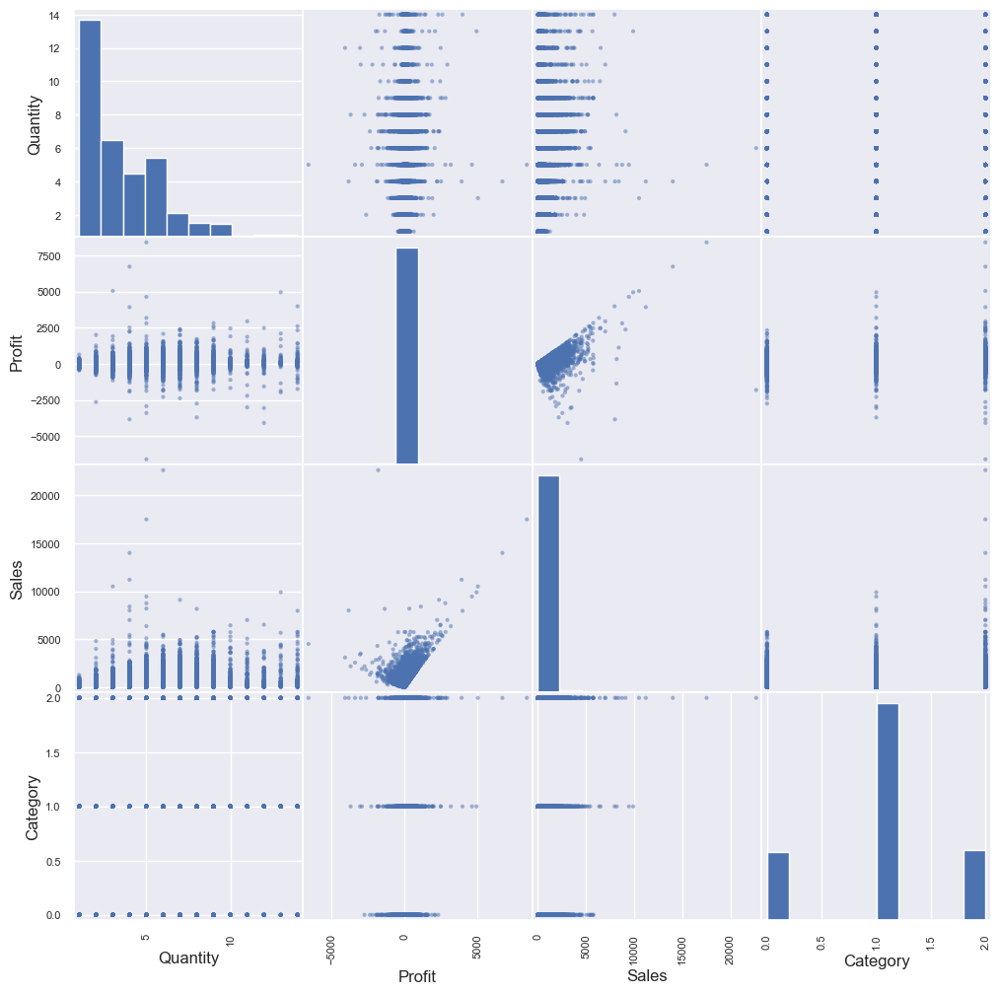

In [135]:
from pandas.plotting import scatter_matrix 
scatter_matrix(data,figsize=(12,12))

In [136]:
#Split data & Labels
data_WithoutLabels=data.iloc[:,0:5];
#Labels
data_Labels=data[["Segment"]]
# data_Labels=data[["Segment","Region"]]

In [137]:
data_Labels

,Segment
0,Consumer
1,Consumer
2,Consumer
3,Corporate
4,Corporate
...,...
51285,Consumer
51286,Consumer
51287,Consumer
51288,Corporate


In [138]:
#!pip install prince

In [139]:
data_WithoutLabels

,Quantity,Profit,Sales,Category,Region
0,2.0,62.154400,221.979996,2,Central US
1,2.0,-2.524800,12.624000,1,Eastern Asia
2,2.0,54.713600,341.959991,0,Southeastern Asia
3,9.0,763.155029,2402.864990,2,Western Europe
4,6.0,214.740005,508.679993,0,Western Europe
...,...,...,...,...,...
51285,3.0,16.011000,213.479996,2,Southern US
51286,4.0,124.780800,259.959991,2,Central US
51287,4.0,22.047199,71.120003,0,Western Europe
51288,2.0,-21.167999,9.612000,1,South America


In [140]:
data_Labels

,Segment
0,Consumer
1,Consumer
2,Consumer
3,Corporate
4,Corporate
...,...
51285,Consumer
51286,Consumer
51287,Consumer
51288,Corporate


In [141]:
le = preprocessing.LabelEncoder()
data_WithoutLabels['Region'] = le.fit_transform(data_WithoutLabels['Region'])
# le = preprocessing.LabelEncoder()
# data['Region'] = le.fit_transform(data['Region'])



In [142]:
# scales our data
from sklearn.preprocessing import StandardScaler
#instanciation 
sc = StandardScaler()
#Normalization
Z = sc.fit_transform(data_WithoutLabels)
print(Z)



[[-0.64796444  0.19240311 -0.05027187  1.59265357 -1.17155064]
 [-0.64796444 -0.17859305 -0.47966669 -0.00877366 -0.86181998]
 [-0.64796444  0.14972311  0.19581034 -1.61020089  0.22223734]
 ...
 [ 0.229712   -0.03764948 -0.3596898  -1.61020089  1.30629465]
 [-0.64796444 -0.28552936 -0.48584438 -0.00877366  0.067372  ]
 [-0.20912622 -0.15378625 -0.37966681 -0.00877366 -0.39722399]]


In [143]:
data.head(1000)

,Quantity,Profit,Sales,Category,Region,Segment
0,2.0,62.154400,221.979996,2,Central US,Consumer
1,2.0,-2.524800,12.624000,1,Eastern Asia,Consumer
2,2.0,54.713600,341.959991,0,Southeastern Asia,Consumer
3,9.0,763.155029,2402.864990,2,Western Europe,Corporate
4,6.0,214.740005,508.679993,0,Western Europe,Corporate
...,...,...,...,...,...,...
995,3.0,242.028000,990.468018,0,Southern US,Corporate
996,2.0,1.920000,86.940002,1,South America,Corporate
997,5.0,742.349976,3227.699951,2,Western Europe,Corporate
998,3.0,0.801000,75.411003,1,Western Europe,Corporate


In [144]:
data_WithoutLabels

,Quantity,Profit,Sales,Category,Region
0,2.0,62.154400,221.979996,2,5
1,2.0,-2.524800,12.624000,1,7
2,2.0,54.713600,341.959991,0,14
3,9.0,763.155029,2402.864990,2,21
4,6.0,214.740005,508.679993,0,21
...,...,...,...,...,...
51285,3.0,16.011000,213.479996,2,18
51286,4.0,124.780800,259.959991,2,5
51287,4.0,22.047199,71.120003,0,21
51288,2.0,-21.167999,9.612000,1,13


In [145]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters=3, init='random', n_init=3, random_state=100).fit(Z)

In [146]:
#Cluster centers
display(model.cluster_centers_)


array([[ 1.22454616,  2.41110034,  3.36614394,  0.19617964,  0.0134533 ],
       [-0.04856067, -0.11092589, -0.14586625,  0.0786696 ,  0.70721804],
       [-0.06243339, -0.10160069, -0.15437918, -0.13042969, -0.98661327]])

K-MEANS, unlike the CAH, does not provide tools to help detect the number of classes. We must program them in Python or use procedures offered by dedicated packages. The scheme is often the same: we vary the number of groups and we monitor the evolution of a quality indicator of the solution i.e. the ability of individuals to be closer to their congeners of the same group than to individuals of other groups. In what follows, we calculate the “Elbow method”  for different numbers of groups resulting from the method of moving centers.

<div style='font-size:100%;'>
    <a id='kc'></a>
    <h1 style='color: black; font-weight: bold; font-family: Calibri;'>
        <left> K_means Clustering </left>
    </h1>
 
</div>

### Plotting
Take note of matplotlib's `c=` argument to color items in the plot, along with our stacking two different plotting functions in the same plot.

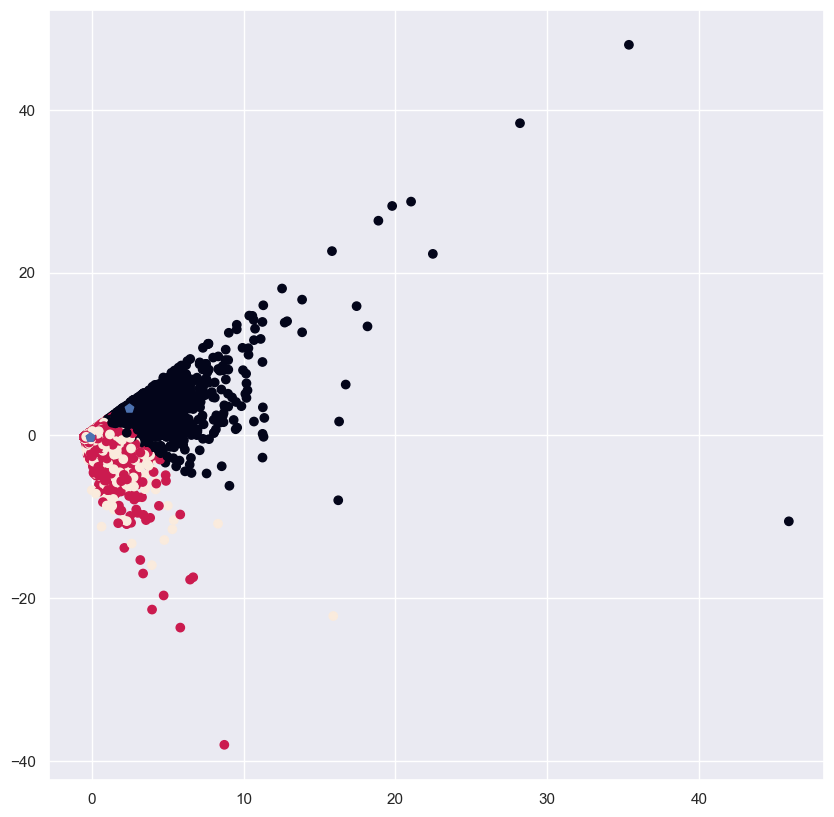

In [118]:
plt.figure(figsize=(10,10))
plt.scatter(Z[:,2],Z[:,1], c=model.labels_);
plt.scatter(model.cluster_centers_[:,1],model.cluster_centers_[:,2], c='b', marker='p', s=40);

In [51]:
#Display the cross Table
#Sort index 
idk = np.argsort(model.labels_);
pd.crosstab(data_Labels,model.labels_)

ValueError: Buffer has wrong number of dimensions (expected 1, got 2)

<div style='font-size:100%;'>
    <a id='import'></a>
    <h1 style='color: black; font-weight: bold; font-family: Calibri;'>
        <left> Agglomerative Clustering </left>
    </h1>
 
</div>


###steps:

1.   Compute the distance matrix
2.   Merge the two closest clusters
3.   Update the distance matrix
4.   Repeat Step 2 until only one cluster remains




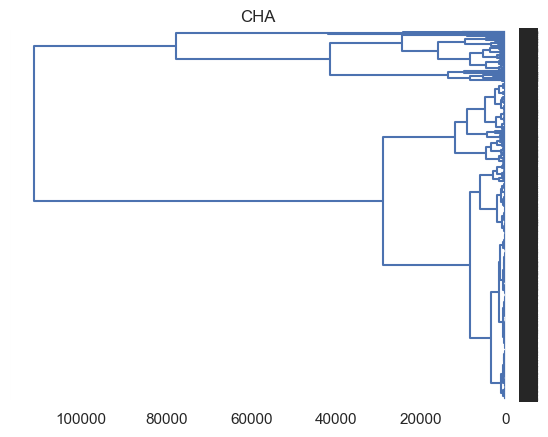

In [148]:
#encodage des données
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
data_WithoutLabels['Region'] = le.fit_transform(data_WithoutLabels['Region'])

###################First Method####################

from matplotlib import pyplot as plt 
from scipy.cluster.hierarchy import dendrogram, linkage,fcluster
#Distance matrix
Z = linkage(data_WithoutLabels,method='ward',metric='euclidean')
#Plot the corresponding dendrogram 
plt.title("CHA") 
dendrogram(Z,labels=data_WithoutLabels.index,orientation='left',color_threshold=0) 
plt.show()

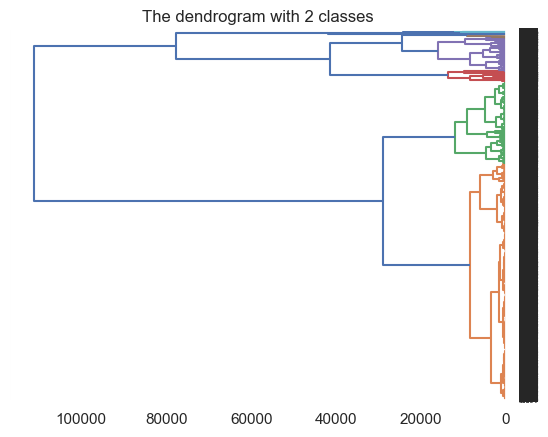

[2 1 2 ... 1 1 1]


In [149]:
# The dendrogram with 2 classes
plt.title('The dendrogram with 2 classes') 
dendrogram(Z,labels=data_WithoutLabels.index,orientation='left',color_threshold=17500) 
plt.show()

#HEIGHT t = 17500 
groupes_cah = fcluster(Z,t=17500,criterion='distance') 
print(groupes_cah)

In [150]:
###################Second Method####################
import scipy.cluster.hierarchy as hac
from scipy.spatial.distance import pdist

plt.figure(figsize=(11,8.5))
dist_mat = pdist(data_WithoutLabels, metric="euclidean")
ward_data = hac.ward(dist_mat)

hac.dendrogram(ward_data);

Error in callback <function flush_figures at 0x000001B44A98C790> (for post_execute):


KeyboardInterrupt: 

In [151]:
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import numpy as np

!pip install ruamel-yaml
!pip install dataprep

  0%|                                                                                          | 0/892 [00:00<…

DataPrep Report
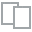
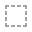
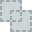
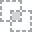
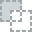
...
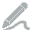
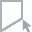
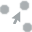
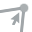
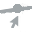

In [152]:
from dataprep.eda import create_report,plot,plot_missing
create_report(data_WithoutLabels)

In [153]:
import plotly.express as px
fig = px.scatter(data, x="Segment", y="Profit")
fig.show()


<div style='font-size:100%;'>
    <a id='import'></a>
    <h1 style='color: black; font-weight: bold; font-family: Calibri;'>
        <center> Importing necessary libraries 📚 </center>
    </h1>
 
</div>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
import pygrametl
from pygrametl.tables import Dimension
from pygrametl.tables import FactTable

In [3]:
import pyodbc 
# conn = pyodbc.connect('Driver={SQL Server};'
#                       'Server=NADY-LAPTOP;'
#                       'Database=DataProjet;'
#                       'Trusted_Connection=yes;')

# cursor = conn.cursor()

conn2 = pyodbc.connect('Driver={SQL Server};'
                      'Server=DESKTOP-HH930O1;'
                      'Database=DW_projet_py;'
                      'Trusted_Connection=yes;')

cursor2 = pygrametl.ConnectionWrapper(connection=conn2)



<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Warnings ignoring 
    </h1>
</div>

In [4]:
# Suppress all warnings
import warnings
warnings.filterwarnings("ignore")

In [5]:
%matplotlib inline

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Importing Fact Sales & Dim Customer & Dim Ship
    </h1>
</div>

In [6]:
SQL_Query = pd.read_sql_query('''select * FROM DW_projet_py.dbo.FactSales''', conn2)
data = pd.DataFrame(SQL_Query)


In [7]:
SQL_Query = pd.read_sql_query('''select * FROM DW_projet_py.dbo.dimCustomer''', conn2)
Customer = pd.DataFrame(SQL_Query)


In [8]:
SQL_Query = pd.read_sql_query('''select * FROM DW_projet_py.dbo.DimShip0''', conn2)
Ship = pd.DataFrame(SQL_Query)

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Renaming features to merge
    </h1>
</div>

In [9]:

data=data.rename(columns={'FK_Customer':'Customer_PK'})
data=data.rename(columns={'FK_Ship':'Ship_PK'})
#First 5 rows in data

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Fact Sales printing
    </h1>
</div>

In [10]:
data.head()

,Customer_PK,FK_Product,Ship_PK,FK_Order,FK_Localisation,Quantity,Profit,Sales,Discount,FK_Date_Order,FK_Date_Ship
0,1,1,1,1,1,2.00,62.15,221.98,0.00,20141111,20141113
1,1,1667,2,4399,165,2.00,-2.52,12.62,0.20,20120219,20120225
2,1,1707,1,1,148,2.00,54.71,341.96,0.00,20141111,20141113
3,2,2,1,2,2,9.00,763.16,2402.86,0.15,20130717,20130719
4,2,446,1,2,184,6.00,214.74,508.68,0.10,20130717,20130719


<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Dim Customer printing
    </h1>
</div>

In [ ]:
Customer.head()

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Dim Ship printing
    </h1>
</div>

In [11]:
Ship.head()

,Ship_PK,Ship_Mode
0,1,First Class
1,2,Standard Class
2,3,Same Day
3,4,Second Class


In [12]:
#mering in order to add ship_mode and segment with the attributes that alaready existe in our fact 

data['Ship_Mode']=pd.merge(data,Ship,on='Ship_PK',how='left')['Ship_Mode']
data['Segment']=pd.merge(data,Customer,on='Customer_PK',how='left')['Segment']

In [13]:
#dropping useless columns
data=data.drop("FK_Localisation",axis=1)
data=data.drop("FK_Date_Ship",axis=1)
data=data.drop("FK_Date_Order",axis=1)
data=data.drop("Quantity",axis=1)
data=data.drop("Customer_PK",axis=1)
data=data.drop("FK_Product",axis=1)
data=data.drop("FK_Order",axis=1)
data=data.drop("Ship_PK",axis=1)
# data=data.drop("Discount",axis=1)
#First 5 rows in data
data.head()


,Profit,Sales,Discount,Ship_Mode,Segment
0,62.15,221.98,0.00,First Class,Consumer
1,-2.52,12.62,0.20,Standard Class,Consumer
2,54.71,341.96,0.00,First Class,Consumer
3,763.16,2402.86,0.15,First Class,Corporate
4,214.74,508.68,0.10,First Class,Corporate


<div style='font-size:100%;'>
    <a id='discover'></a>
    <h1 style='color: black; font-weight: bold; font-family: Calibri;'>
        <center> Exploring the dataset 🧐 </center>
    </h1>
</div>

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Shape
    </h1>
</div>

In [14]:
#dimensions : nombre de lignes, nombre de colonnes
data.shape

(51290, 5)

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Null Values
    </h1>
</div>

In [15]:
data.isna().sum()

Profit       0
Sales        0
Discount     0
Ship_Mode    0
Segment      0
dtype: int64

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: red; font-weight: bold;'>
        Preprocessing is a necessity! isn't it?
    </h1>
</div>

In [16]:
#data processing
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
data['Segment'] = le.fit_transform(data['Segment'])

In [17]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
data['Ship_Mode'] = le.fit_transform(data['Ship_Mode'])

In [18]:
data.head(60)

,Profit,Sales,Discount,Ship_Mode,Segment
0,62.15,221.98,0.00,0,0
1,-2.52,12.62,0.20,3,0
2,54.71,341.96,0.00,0,0
3,763.16,2402.86,0.15,0,1
4,214.74,508.68,0.10,0,1
5,103.20,210.90,0.00,0,1
6,2.34,18.70,0.20,3,1
7,121.44,247.84,0.00,2,1
8,3.35,9.91,0.20,2,1
9,11.47,34.77,0.00,0,1


<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        We're going to applicate ACP for the 'Segment Feature' so let's drop it first
    </h1>
</div>

In [19]:
# We're going to applicate ACP for the 'Segment' Feature so we are dropping them
# diviser les données en attributs et étiquettes (labes)
X = data.drop("Segment", axis=1)
y = data["Segment"]

<div style='font-size:100%;'>
    <a id='visualization'></a>
    <h3 style='color: black; font-weight: bold; font-family: Calibri;'>
        <center> Visualization 📉📈 </center>
    </h3>
</div>

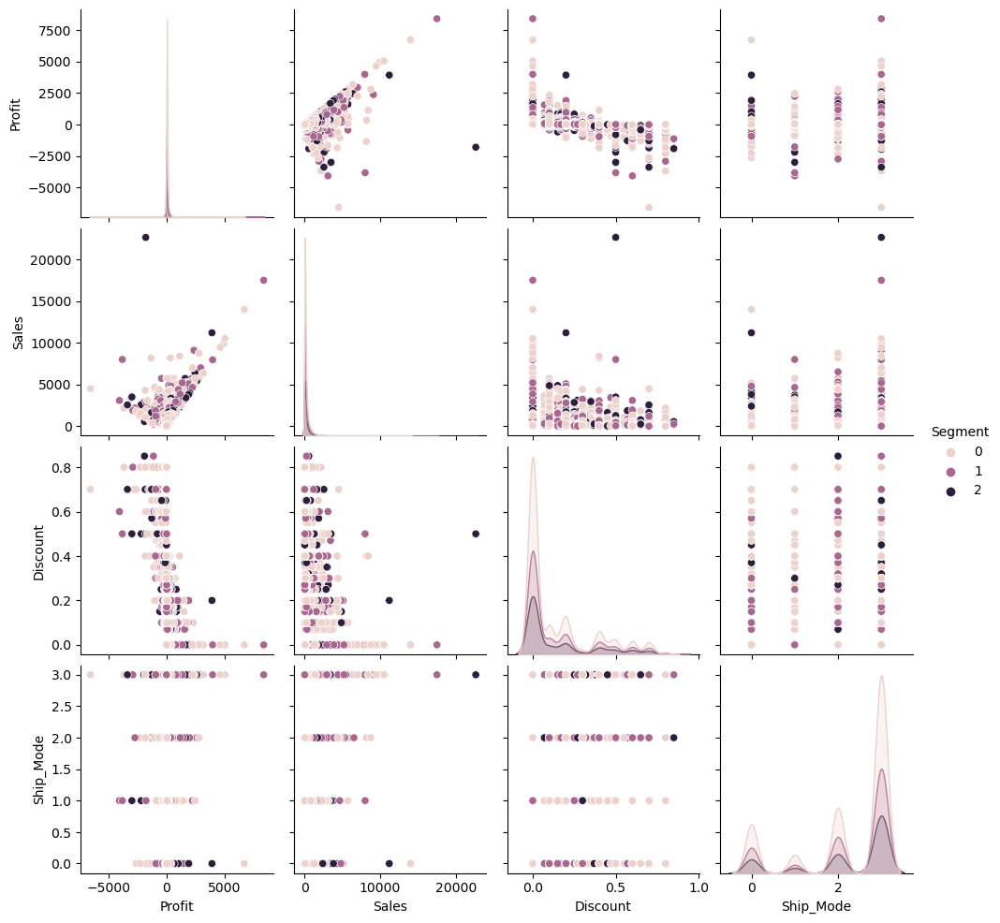

In [20]:
#graphique - croisement deux à deux des variables
import seaborn as sns
sns.pairplot(data, hue="Segment")

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Having an idea about the correlation is a necessity too!
    </h1>
</div>

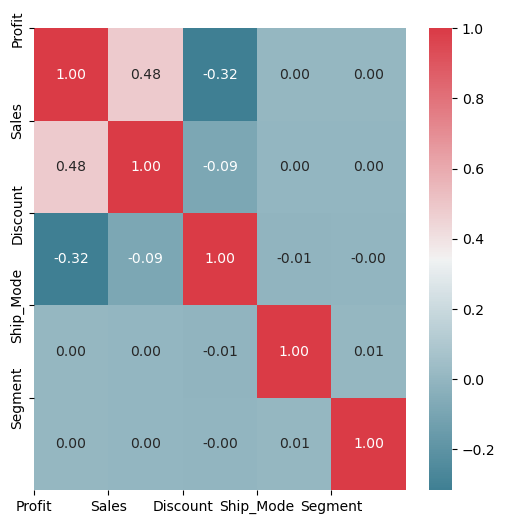

In [21]:
#graphique - croisement deux à deux des variables
#Create Correlation matrix
corr = data.corr()
#Plot figsize
fig, ax = plt.subplots(figsize=(6,6))
#Generate Color Map
colormap = sns.diverging_palette(220, 10, as_cmap=True)
#Generate Heat Map, allow annotations and place floats in map
sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f")
#Apply xticks
plt.xticks(range(len(corr.columns)), corr.columns);
#Apply yticks
plt.yticks(range(len(corr.columns)), corr.columns)
#show plot
plt.show()

<div style='font-size:100%;'>
    <a id='acp'></a>
    <h1 style='color: black; font-weight: bold; font-family: Calibri;'>
        <left> ACP </left>
    </h1>
 
</div>

<div style='font-size:100%;'>
    <a id='visualization'></a>
    <h3 style='color: black; font-weight: bold; font-family: Calibri;'>
        <left> Standarising the features </left>
    </h3>
</div>
<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: red; font-weight: medium;font-family: Calibri;'>
        when we say ACP, we say Standardize our features!
    </h1>
</div>

In [22]:
from sklearn.preprocessing import StandardScaler
#https://mrmint.fr/data-preprocessing-feature-scaling-python
X=data

In [23]:
from sklearn.preprocessing import StandardScaler
#instanciation de l'objet
sc = StandardScaler()
#transformation – centrage-réduction
Z = sc.fit_transform(X)
print(Z)



[[ 0.19240311 -0.05027187 -0.67320984 -2.08171948 -0.86811111]
 [-0.17859305 -0.47966669  0.26895153  0.68811014 -0.86811111]
 [ 0.14972311  0.19581034 -0.67320984 -2.08171948 -0.86811111]
 ...
 [-0.03764948 -0.3596898  -0.67320984  0.68811014 -0.86811111]
 [-0.28552936 -0.48584438  2.62435485  0.68811014  0.43704553]
 [-0.15378625 -0.37966681 -0.67320984 -0.2351664  -0.86811111]]


In [24]:
#vérification_Centrage Réduction 
import numpy as np

#Une variable centrée réduite a un écart type égal à 1.
#écart-type
print(np.std(Z,axis=0,ddof=0))


[1. 1. 1. 1. 1.]


In [25]:
#Analyse en composantes principales avec PCA de "scikit-learn"
from sklearn.decomposition import PCA
#instanciation de l'objet
acp = PCA(svd_solver='full')
# Affichage des paramètres
#https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
print(acp)

PCA(svd_solver='full')


<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
       ACP fitting
    </h1>
</div>

In [26]:
#Appliquer l'ACP
coord = acp.fit_transform(Z)
#nombre de composantes calculées
print(acp.n_components_) 


5


<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
        Explained variance for the ACP..
    </h1>
</div>

In [27]:
#Proportions de variance associées aux axes
print(acp.explained_variance_ratio_)

[0.32423024 0.20128518 0.19884339 0.18403398 0.09160721]


In [28]:
n = X.shape[0]
#nombre de variables/colonnes
p = X.shape[1]
#Par la propriété .explained_variance_ (calcul de la variance expliquée)
eigval = (n-1)/n*acp.explained_variance_
print(eigval)


[1.62115121 1.00642588 0.99421693 0.92016992 0.45803605]


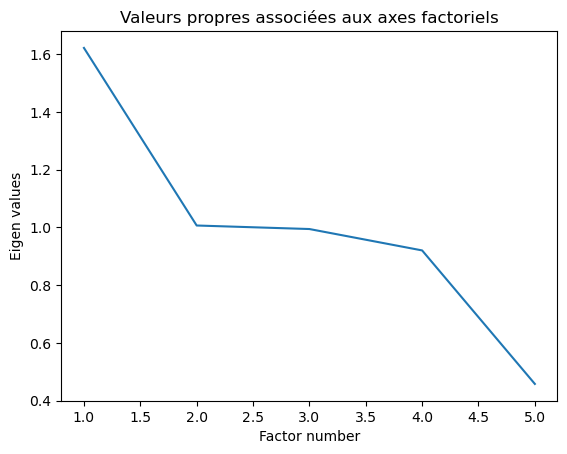

In [29]:
#scree plot
plt.plot(np.arange(1,p+1),eigval)
plt.title("Valeurs propres associées aux axes factoriels")
plt.ylabel("Eigen values")
plt.xlabel("Factor number")
plt.show()

<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
       Let's plot the cumulated variance
    </h1>
</div>

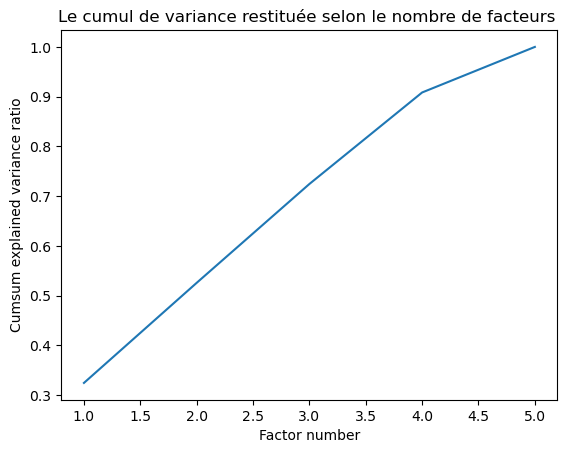

In [30]:
#La variance expliquée cumulée 
plt.plot(np.arange(1,p+1),np.cumsum(acp.explained_variance_ratio_))
plt.title("Le cumul de variance restituée selon le nombre de facteurs ")
plt.ylabel("Cumsum explained variance ratio")
plt.xlabel("Factor number")
plt.show()

In [31]:
#seuils pour test des bâtons brisés
import pandas as pd
bs = 1/np.arange(p,0,-1)
bs = np.cumsum(bs)
bs = bs[::-1]
#Afficher conjointement les valeurs propres  
print(pd.DataFrame({'Val.Propre':eigval}))

   Val.Propre
0        1.62
1        1.01
2        0.99
3        0.92
4        0.46


<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: black; font-weight: bold;'>
       Clients positionning
    </h1>
</div>

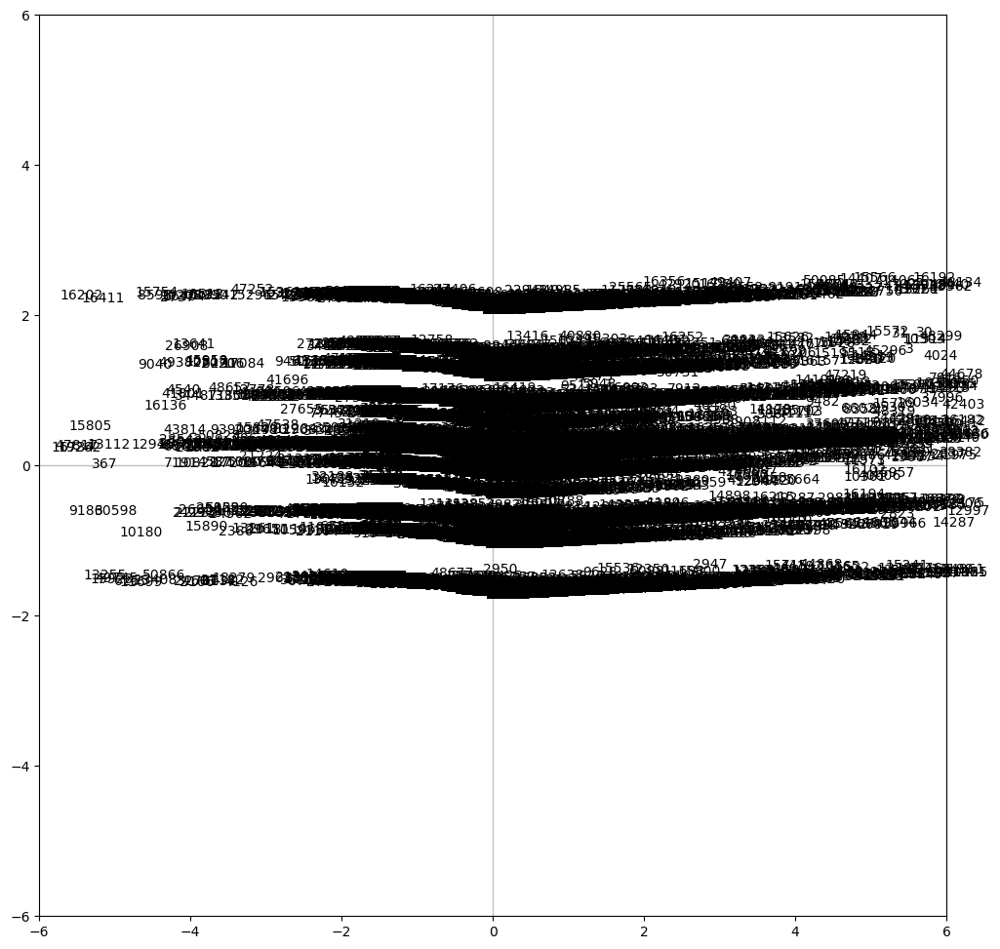

In [32]:
 #positionnement des individus dans le premier plan
fig, axes = plt.subplots(figsize=(12,12))
axes.set_xlim(-6,6) #même limites en abscisse
axes.set_ylim(-6,6) #et en ordonnée
#placement des étiquettes des observations
for i in range(n): plt.annotate(X.index[i],(coord[i,0],coord[i,1]))
#ajouter les axes
plt.plot([-6,6],[0,0],color='silver',linestyle='-',linewidth=1)
plt.plot([0,0],[-6,6],color='silver',linestyle='-',linewidth=1)
#affichage
plt.show()

In [33]:
#contribution des individus dans l'inertie totale
di = np.sum(Z**2,axis=1)
print(pd.DataFrame({'ID':X.index,'d_i':di}))

          ID   d_i
0          0  5.58
1          1  1.56
2          2  5.60
3          3 41.84
4          4  5.99
...      ...   ...
51285  51285  0.89
51286  51286  1.99
51287  51287  1.81
51288  51288  7.87
51289  51289  1.43

[51290 rows x 2 columns]


In [34]:
cos2 = coord**2
for j in range(p):
 cos2[:,j] = cos2[:,j]/di
print(pd.DataFrame({'id':X.index,'COS2_1':cos2[:,0],'COS2_2':cos2[:,1]}))

          id  COS2_1  COS2_2
0          0    0.02    0.76
1          1    0.17    0.01
2          2    0.04    0.76
3          3    0.71    0.05
4          4    0.21    0.25
...      ...     ...     ...
51285  51285    0.05    0.68
51286  51286    0.23    0.00
51287  51287    0.00    0.00
51288  51288    0.33    0.05
51289  51289    0.00    0.34

[51290 rows x 3 columns]


In [35]:
# Contribution des individus aux axes
ctr = coord**2
for j in range(p):
 ctr[:,j] = ctr[:,j]/(n*eigval[j])

print(pd.DataFrame({'id':X.index,'CTR_1':ctr[:,0],'CTR_2':ctr[:,1]}))

          id  CTR_1  CTR_2
0          0   0.00   0.00
1          1   0.00   0.00
2          2   0.00   0.00
3          3   0.00   0.00
4          4   0.00   0.00
...      ...    ...    ...
51285  51285   0.00   0.00
51286  51286   0.00   0.00
51287  51287   0.00   0.00
51288  51288   0.00   0.00
51289  51289   0.00   0.00

[51290 rows x 3 columns]


In [36]:
#le champ components_ de l'objet ACP
print(acp.components_)
#racine carrée des valeurs propres
sqrt_eigval = np.sqrt(eigval)
#corrélation des variables avec les axes
corvar = np.zeros((p,p))
for k in range(p):
 corvar[:,k] = acp.components_[k,:] * sqrt_eigval[k]

#afficher la matrice des corrélations variables x facteurs
print(corvar)
#on affiche pour les deux premiers axes
print(pd.DataFrame({'id':X.columns,'COR_1':corvar[:,0],'COR_2':corvar[:,1]}))

[[ 0.68141608  0.59205324 -0.43007938  0.01060806  0.00801771]
 [ 0.01660984  0.05066405  0.06546065 -0.72008588 -0.68872962]
 [ 0.00513626  0.02357025  0.03712646 -0.68782423  0.72452571]
 [ 0.06121445  0.53556769  0.83697275  0.09081764  0.02547164]
 [-0.72912457  0.59959804 -0.32991645 -0.00371061 -0.00095417]]
[[ 8.67609190e-01  1.66631199e-02  5.12138666e-03  5.87202639e-02
  -4.93459559e-01]
 [ 7.53828446e-01  5.08265656e-02  2.35019982e-02  5.13745922e-01
   4.05798126e-01]
 [-5.47596146e-01  6.56706340e-02  3.70189539e-02  8.02870197e-01
  -2.23282048e-01]
 [ 1.35066558e-02 -7.22395772e-01 -6.85832483e-01  8.71172607e-02
  -2.51128114e-03]
 [ 1.02084998e-02 -6.90938924e-01  7.22427687e-01  2.44337916e-02
  -6.45766975e-04]]
          id  COR_1  COR_2
0     Profit   0.87   0.02
1      Sales   0.75   0.05
2   Discount  -0.55   0.07
3  Ship_Mode   0.01  -0.72
4    Segment   0.01  -0.69


<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: red; font-weight: bold;'>
       Correlation Circle
    </h1>
</div>

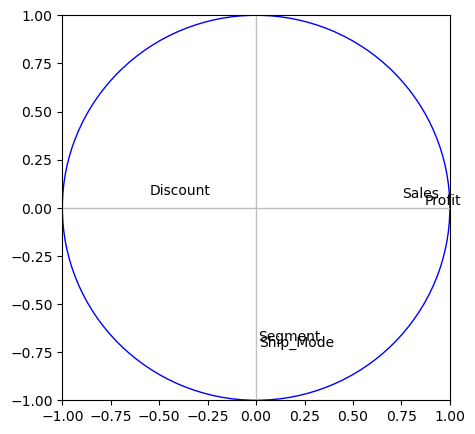

In [37]:
#cercle des corrélations
fig, axes = plt.subplots(figsize=(5,5
                            ))
axes.set_xlim(-1,1)
axes.set_ylim(-1,1)
#affichage des étiquettes (noms des variables)
for j in range(p):
 plt.annotate(X.columns[j],(corvar[j,0],corvar[j,1]))

#ajouter les axes
plt.plot([-1,1],[0,0],color='silver',linestyle='-',linewidth=1)
plt.plot([0,0],[-1,1],color='silver',linestyle='-',linewidth=1)
#ajouter un cercle
cercle = plt.Circle((0,0),1,color='blue',fill=False)
axes.add_artist(cercle)
#affichage
plt.show()

In [38]:
#cosinus carré des variables
#La qualité de représentation des variables par rapport aux axes
cos2var = corvar**2
print(pd.DataFrame({'id':X.columns,'COS2_1':cos2var[:,0],'COS2_2':cos2var[:,1]}))

          id  COS2_1  COS2_2
0     Profit    0.75    0.00
1      Sales    0.57    0.00
2   Discount    0.30    0.00
3  Ship_Mode    0.00    0.52
4    Segment    0.00    0.48


In [39]:
#Contribution des variables aux axes 
#contributions
ctrvar = cos2var
for k in range(p):
 ctrvar[:,k] = ctrvar[:,k]/eigval[k]
#on n'affiche que pour les deux premiers axes
print(pd.DataFrame({'id':X.columns,'CTR_1':ctrvar[:,0],'CTR_2':ctrvar[:,1]}))

          id  CTR_1  CTR_2
0     Profit   0.46   0.00
1      Sales   0.35   0.00
2   Discount   0.18   0.00
3  Ship_Mode   0.00   0.52
4    Segment   0.00   0.47


<div style='font-size:60%;'>
    <a id='SA'></a>
    <h1 style='color: red; font-weight: bold;'>
       Pie plot for the segment division
    </h1>
</div>

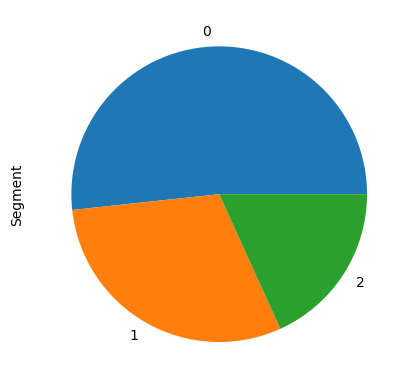

In [40]:
data['Segment'].value_counts().plot.pie()
plt.show()